In [0]:
adls_key = dbutils.secrets.get(scope = "key-vault-secret", key = "storageaccountkeys")    

In [0]:
storageAccountName = "adlssupplychaindeve"
blobContainerName = "raw"
mountPoint = "/mnt/raw/"
if not any(mount.mountPoint == mountPoint for mount in dbutils.fs.mounts()):
  try:
    dbutils.fs.mount(
      source = "wasbs://raw@adlssupplychaindeve.blob.core.windows.net".format(blobContainerName, storageAccountName),
      mount_point = mountPoint,
      extra_configs = {'fs.azure.account.key.' + storageAccountName + '.blob.core.windows.net': adls_key}
      #extra_configs = {'fs.azure.sas.' + blobContainerName + '.' + storageAccountName + '.blob.core.windows.net': sasToken}
    )
    print("mount succeeded!")
  except Exception as e:
    print("mount exception", e)

In [0]:
storageAccountName = "adlssupplychaindeve"
blobContainerName = "silver"
mountPoint = "/mnt/silver/"
if not any(mount.mountPoint == mountPoint for mount in dbutils.fs.mounts()):
  try:
    dbutils.fs.mount(
      source = "wasbs://silver@adlssupplychaindeve.blob.core.windows.net".format(blobContainerName, storageAccountName),
      mount_point = mountPoint,
      extra_configs = {'fs.azure.account.key.' + storageAccountName + '.blob.core.windows.net': adls_key}
      #extra_configs = {'fs.azure.sas.' + blobContainerName + '.' + storageAccountName + '.blob.core.windows.net': sasToken}
    )
    print("mount succeeded!")
  except Exception as e:
    print("mount exception", e)

In [0]:
storageAccountName = "adlssupplychaindeve"
blobContainerName = "bronze"
mountPoint = "/mnt/bronze/"
if not any(mount.mountPoint == mountPoint for mount in dbutils.fs.mounts()):
  try:
    dbutils.fs.mount(
      source = "wasbs://bronze@adlssupplychaindeve.blob.core.windows.net".format(blobContainerName, storageAccountName),
      mount_point = mountPoint,
      extra_configs = {'fs.azure.account.key.' + storageAccountName + '.blob.core.windows.net': adls_key}
      #extra_configs = {'fs.azure.sas.' + blobContainerName + '.' + storageAccountName + '.blob.core.windows.net': sasToken}
    )
    print("mount succeeded!")
  except Exception as e:
    print("mount exception", e)

In [0]:
storageAccountName = "adlssupplychaindeve"
blobContainerName = "gold"
mountPoint = "/mnt/gold/"
if not any(mount.mountPoint == mountPoint for mount in dbutils.fs.mounts()):
  try:
    dbutils.fs.mount(
      source = "wasbs://gold@adlssupplychaindeve.blob.core.windows.net".format(blobContainerName, storageAccountName),
      mount_point = mountPoint,
      extra_configs = {'fs.azure.account.key.' + storageAccountName + '.blob.core.windows.net': adls_key}
      #extra_configs = {'fs.azure.sas.' + blobContainerName + '.' + storageAccountName + '.blob.core.windows.net': sasToken}
    )
    print("mount succeeded!")
  except Exception as e:
    print("mount exception", e)

In [0]:
dbutils.fs.mounts()

[MountInfo(mountPoint='/databricks-datasets', source='databricks-datasets', encryptionType=''),
 MountInfo(mountPoint='/mnt/gold/', source='wasbs://gold@adlssupplychaindeve.blob.core.windows.net', encryptionType=''),
 MountInfo(mountPoint='/Volumes', source='UnityCatalogVolumes', encryptionType=''),
 MountInfo(mountPoint='/mnt/silver/', source='wasbs://silver@adlssupplychaindeve.blob.core.windows.net', encryptionType=''),
 MountInfo(mountPoint='/databricks/mlflow-tracking', source='databricks/mlflow-tracking', encryptionType=''),
 MountInfo(mountPoint='/databricks-results', source='databricks-results', encryptionType=''),
 MountInfo(mountPoint='/mnt/raw/', source='wasbs://raw@adlssupplychaindeve.blob.core.windows.net', encryptionType=''),
 MountInfo(mountPoint='/databricks/mlflow-registry', source='databricks/mlflow-registry', encryptionType=''),
 MountInfo(mountPoint='/mnt/bronze/', source='wasbs://bronze@adlssupplychaindeve.blob.core.windows.net', encryptionType=''),
 MountInfo(mount

In [0]:
%fs ls mnt/raw/

path,name,size,modificationTime
dbfs:/mnt/raw/product_table,product_table,4183,1710935129000
dbfs:/mnt/raw/purchaseorder,purchaseorder,2046,1710935103000
dbfs:/mnt/raw/supplier_data,supplier_data,6995684,1710935161000
dbfs:/mnt/raw/transportation,transportation,63,1710935215000


#Bronze

In [0]:
# Read supplier data
supplier_df = spark.read.csv('/mnt/raw/supplier_data', header=True, inferSchema=True)

# Read transportation data
transportation_df = spark.read.csv('/mnt/raw/transportation', header=True, inferSchema=True)

# Read product data
product_df = spark.read.csv('/mnt/raw/product_table', header=True, inferSchema=True)

# Read shipping data
purchaseorder_df = spark.read.csv('/mnt/raw/purchaseorder', header=True, inferSchema=True)

In [0]:
display(supplier_df)

S_ID,Tin_No,Company_Name,Date_of_Reg,SubCity,Town,Telephone,Fax,EMail,Business_License_No,Business_Type
1,Local-0004765279,ፍቅር ጠቅላላ ንግድ Fiker General Trading,2019-03-21T00:00:00Z,Akaki Kality,Addis Ababa,2.51911E+11,2.51114E+11,betebebubi@yahoo.com,14/665/1910/2005,Computers and Related Equipments
2,Local-0052225274,ጌትሰን ኢንዳስትሪስ ኃላ/የተ/የግ/ማህበር Getson Industries Pvt L,2017-03-17T00:00:00Z,Kirkos,Addis Ababa,2.5191E+11,2.51116E+11,info@getson.et,MT/AA/14/706/653400/2009,Chemicals and chemical products
3,Local-0052225274,ጌትሰን ኢንዳስትሪስ ኃላ/የተ/የግ/ማህበር Getson Industries Pvt L,2017-03-17T00:00:00Z,Kirkos,Addis Ababa,2.5191E+11,2.51116E+11,info@getson.et,MT/AA/14/706/653407/2009,Laboratory materials and Equipment
4,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie Tewodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,03/213/01/3025/2005,Grade VI
5,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie Tewodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,AM/BD/HDR/03/213/6011912/2008,Building Materials
6,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie TEwodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,Am/BD/HDR/03/213/6324663/2009,Construction Material leasing
7,Local-0002221802,ዉብዓለም ታደሰ እህል፣አትክልት እና ፍራፍሬ ንግድ ድርጅት,2018-06-20T00:00:00Z,M/Jimma,Jimma,2.51912E+11,2.51912E+11,wubalemtadese3179@gmail.com,06/6/216/01/000000017/2003,Vegetables and Fruits
8,Local-0002221802,ዉብዓለም ታደሰ እህል፣አትክልት እና ፍራፍሬ ንግድ ድርጅት,2018-06-20T00:00:00Z,M/Jimma,Jimma,2.51912E+11,2.51912E+11,wubalemtadese3179@gmail.com,06/61213/000000017/2003,Grain Trade
9,Local-0002646575,ክሬቲቭ ቤት ለቤት ጠቅላላ የጽዳት ፣ ጥበቃና ጥገና ኃላ/የተ/የግል ማህበር,2020-09-23T00:00:00Z,Kirkos,Addis Abeab,115155623,115214128,creativeclse@gmail.com,14/706/605110/2006,Cleaning and Security Service
10,Local-0054425545,ታታዬ አይሲቲ ሶሉውሽንስ Tataye ICT Solutions,2020-08-25T00:00:00Z,Arada,Addis Ababa,2.51922E+11,2.51922E+11,tatayeict@gmail.com,AA/AR/09/14/670/3692239/2012,Computer and Related Equipment


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, when, count



# Data Quality Framework - Total null counts for each table
supplier_null_counts = supplier_df.select([count(when(col(c).isNull(), c)).alias(c+"_null_count") for c in supplier_df.columns])
transportation_null_counts = transportation_df.select([count(when(col(c).isNull(), c)).alias(c+"_null_count") for c in transportation_df.columns])
product_null_counts = product_df.select([count(when(col(c).isNull(), c)).alias(c+"_null_count") for c in product_df.columns])
purchaseorder_null_counts = purchaseorder_df.select([count(when(col(c).isNull(), c)).alias(c+"_null_count") for c in purchaseorder_df.columns])

# Display total null counts for each table
# Display total null counts for each table using display function
display(supplier_null_counts)
display(transportation_null_counts)
display(product_null_counts)
display(purchaseorder_null_counts)



S_ID_null_count,Tin_No_null_count,Company_Name_null_count,Date_of_Reg_null_count,SubCity_null_count,Town_null_count,Telephone_null_count,Fax_null_count,EMail_null_count,Business_License_No_null_count,Business_Type_null_count
0,0,0,0,955,2323,1078,26287,0,1,0


TRANSPORTATION_ID_null_count,MODES_null_count
0,0


P_ID_null_count,Product_type_null_count,Price_null_count
0,0,0


PO_ID_null_count,P_ID_null_count,Availability_null_count,Number_of_products_sold_null_count,Revenue_generated_null_count,Stock_levels_null_count,Lead_times_null_count,Order_quantities_null_count,Shipping_times_null_count,Shipping_carriers_null_count,Shipping_costs_null_count,Supplier_Id_null_count,Location_null_count,Lead_time_null_count,Production_volumes_null_count,Manufacturing_lead_time_null_count,Manufacturing_costs_null_count,Inspection_results_null_count,Defect_rates_null_count,Transportation_id_null_count,Routes_null_count,Costs_null_count
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Data Type Validation
def validate_data_types(df, table_name):
    print(f"Validating data types for {table_name}...")
    for field in df.schema.fields:
        column_name = field.name
        column_type = str(field.dataType)
        
        # Check for Integer type
        if "int" in column_type.lower():
            df = df.withColumn(column_name, when(col(column_name).isNotNull(), col(column_name).cast("int")))
            print(f"{column_name}: Integer type validation applied.")
        
        # Check for Double type
        elif "double" in column_type.lower():
            df = df.withColumn(column_name, when(col(column_name).isNotNull(), col(column_name).cast("double")))
            print(f"{column_name}: Double type validation applied.")
        
        # Check for String type
        elif "string" in column_type.lower():
            df = df.withColumn(column_name, when(col(column_name).isNotNull(), col(column_name).cast("string")))
            print(f"{column_name}: String type validation applied.")
        
        # Check for Date type
        elif "date" in column_type.lower():
            df = df.withColumn(column_name, when(col(column_name).isNotNull(), col(column_name).cast("date")))
            print(f"{column_name}: Date type validation applied.")
        
        # Check for Boolean type
        elif "boolean" in column_type.lower():
            df = df.withColumn(column_name, when(col(column_name).isNotNull(), col(column_name).cast("boolean")))
            print(f"{column_name}: Boolean type validation applied.")
        
        # Add more data types as needed
    
    print(f"Validation for {table_name} completed.\n")
    return df


# Validate data types for each table
supplier_data = validate_data_types(supplier_df, "supplier_data")
transportation_data = validate_data_types(transportation_df, "transportation_data")
product_data = validate_data_types(product_df, "product_data")
purchaseorder_data = validate_data_types(purchaseorder_df, "purchaseorder_data")


Validating data types for supplier_data...
S_ID: Integer type validation applied.
Tin_No: String type validation applied.
Company_Name: String type validation applied.
SubCity: String type validation applied.
Town: String type validation applied.
Telephone: String type validation applied.
Fax: String type validation applied.
EMail: String type validation applied.
Business_License_No: String type validation applied.
Business_Type: String type validation applied.
Validation for supplier_data completed.

Validating data types for transportation_data...
TRANSPORTATION_ID: Integer type validation applied.
MODES: String type validation applied.
Validation for transportation_data completed.

Validating data types for product_data...
P_ID: String type validation applied.
Product_type: String type validation applied.
Price: Double type validation applied.
Validation for product_data completed.

Validating data types for purchaseorder_data...
PO_ID: Integer type validation applied.
P_ID: String 

In [0]:
def data_quality_checks_bronze(df,table_name):
    #check for data types
    for field in df.schema.fields:
        column_name=field.name
        column_type= str(field.dataType)
        #print(f"{column_name} data type: {column_type}")

    #check uniqueness of primary keys (if they exist in data frame)
    primary_key_columns =["S_ID","PO_ID","TRANSPORTATION_ID","P_ID"]
    for column in primary_key_columns:
        if column in df.columns:
            duplicate_count = df.groupBy(column).count().where(col("count") > 1).count()
            if duplicate_count > 0:
                print(f"Warning: {duplicate_count} duplicate rows found based on primary key column '{column}' in {table_name}.")
            else:
                print("No Duplicates found")

# Call the function for each dataframe
data_quality_checks_bronze(supplier_df,"supplier_data")
data_quality_checks_bronze(transportation_df, "transportation_data")
data_quality_checks_bronze(product_df, "product_data")
data_quality_checks_bronze(purchaseorder_df, "purchaseorder_data")

No Duplicates found
No Duplicates found
No Duplicates found
No Duplicates found
No Duplicates found


In [0]:
display(transportation_data)

TRANSPORTATION_ID,MODES
1,Road
2,Air
3,Rail
4,Sea


In [0]:
# Data Cleaning - Handling missing values
supplier_data = supplier_data.na.fill({"SubCity": "Unknown", "Telephone": "999999999"})
transportation_data = transportation_data.na.fill({"MODES": "Unknown"})
product_data = product_data.na.fill({"P_ID": "Unknown", "Product_type": "Unknown"})
purchaseorder_data = purchaseorder_data.na.fill({"PO_ID": 0, "P_ID": 0, "Order_quantities": 0})

# Data Enrichment - No additional data sources provided for simplicity

# Data Partitioning - Assuming no partitioning for simplicity
# Write the processed data to the Bronze Layer as Delta tables
supplier_data.repartition(1).write.format("delta").mode("overwrite").save("/mnt/bronze/supplier/supplier_data_delta")
transportation_data.write.format("delta").mode("overwrite").save("/mnt/bronze/transportation/transportation_data_delta")
product_data.write.format("delta").mode("overwrite").save("/mnt/bronze/product/product_data_delta")
purchaseorder_data.write.format("delta").mode("overwrite").save("/mnt/bronze/purchaseorder/purchaseorder_data_delta")


# Silver

In [0]:

# Read Delta tables from Bronze Layer
supplier_data = spark.read.format("delta").load("/mnt/bronze/supplier/supplier_data_delta/")
transportation_data = spark.read.format("delta").load("/mnt/bronze/transportation/transportation_data_delta")
product_data = spark.read.format("delta").load("/mnt/bronze/product/product_data_delta")
purchaseorder_data = spark.read.format("delta").load("/mnt/bronze/purchaseorder/purchaseorder_data_delta")

# Business Rule Application (Silver Layer) - Supplier Data
supplier_data = supplier_data.withColumn("Negotiation_Score", 
                                         when(col("Business_Type") == "Printing Press", 0.9)
                                         .when(col("Business_Type") == "Stationery Materials", 0.8)
                                         .when(col("Business_Type") == "Software Development and Design", 0.95)
                                         .otherwise(0.75))

supplier_data = supplier_data.withColumn("Defect_Quality", 
                                         when(col("Business_Type").isin("Detergents", "Sanitary Items"), "High")
                                         .when(col("Business_Type").isin("Building and Construction Materials", 
                                                                       "Metal and Metal Products"), "Medium")
                                         .otherwise("Low"))

# Business Rule Application (Silver Layer) - Transportation Data
transportation_data = transportation_data.withColumn("Priority",
                                                     when(col("MODES") == "Truck", 1)
                                                     .when(col("MODES") == "Ship", 2)
                                                     .when(col("MODES") == "Airplane", 3)
                                                     .otherwise(0))


# Business Rule Application (Silver Layer) - Product Data
product_data = product_data.withColumn("Price_Category",
                                       when(col("Price") < 50, "Low Price")
                                       .when((col("Price") >= 50) & (col("Price") < 200), "Medium Price")
                                       .when(col("Price") >= 200, "High Price")
                                       .otherwise("Unknown"))


# Business Rule Application (Silver Layer) - Purchase Order Data
purchaseorder_data = purchaseorder_data.withColumn("Total_Cost", col("Order_quantities") * col("Costs"))


In [0]:
# Write the Silver Layer data to Delta Lake - Supplier Data
silver_layer_path_supplier = "/mnt/silver/supplier/"
supplier_data.write.format("delta").mode("overwrite").save(silver_layer_path_supplier)

# Write the Silver Layer data to Delta Lake - Transportation Data
silver_layer_path_transportation = "/mnt/silver/transportation/"
transportation_data.write.format("delta").mode("overwrite").save(silver_layer_path_transportation)

# Write the Silver Layer data to Delta Lake - Product Data
silver_layer_path_product = "/mnt/silver/product/"
product_data.write.format("delta").mode("overwrite").save(silver_layer_path_product)

# Write the Silver Layer data to Delta Lake - Purchase Order Data
silver_layer_path_purchaseorder = "/mnt/silver/purchaseorder/"
purchaseorder_data.write.format("delta").mode("overwrite").save(silver_layer_path_purchaseorder)

#Gold

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, countDistinct, desc, rank, when
from pyspark.sql.window import Window

# Read Silver Layer data for Supplier
silver_layer_supplier_path = "/mnt/silver/supplier/"
supplier_data_silver = spark.read.format("delta").load(silver_layer_supplier_path)

# Read Silver Layer data for Transportation
silver_layer_transportation_path = "/mnt/silver/transportation/"
transportation_data_silver = spark.read.format("delta").load(silver_layer_transportation_path)

# Read Silver Layer data for Product
silver_layer_product_path = "/mnt/silver/product/"
product_data_silver = spark.read.format("delta").load(silver_layer_product_path)

# Read Silver Layer data for Purchase Order
silver_layer_purchaseorder_path = "/mnt/silver/purchaseorder/"
purchaseorder_data_silver = spark.read.format("delta").load(silver_layer_purchaseorder_path)


In [0]:
display(supplier_data_silver)

S_ID,Tin_No,Company_Name,Date_of_Reg,SubCity,Town,Telephone,Fax,EMail,Business_License_No,Business_Type,Negotiation_Score,Defect_Quality
1,Local-0004765279,ፍቅር ጠቅላላ ንግድ Fiker General Trading,2019-03-21T00:00:00Z,Akaki Kality,Addis Ababa,2.51911E+11,2.51114E+11,betebebubi@yahoo.com,14/665/1910/2005,Computers and Related Equipments,0.75,Low
2,Local-0052225274,ጌትሰን ኢንዳስትሪስ ኃላ/የተ/የግ/ማህበር Getson Industries Pvt L,2017-03-17T00:00:00Z,Kirkos,Addis Ababa,2.5191E+11,2.51116E+11,info@getson.et,MT/AA/14/706/653400/2009,Chemicals and chemical products,0.75,Low
3,Local-0052225274,ጌትሰን ኢንዳስትሪስ ኃላ/የተ/የግ/ማህበር Getson Industries Pvt L,2017-03-17T00:00:00Z,Kirkos,Addis Ababa,2.5191E+11,2.51116E+11,info@getson.et,MT/AA/14/706/653407/2009,Laboratory materials and Equipment,0.75,Low
4,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie Tewodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,03/213/01/3025/2005,Grade VI,0.75,Low
5,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie Tewodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,AM/BD/HDR/03/213/6011912/2008,Building Materials,0.75,Low
6,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie TEwodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,Am/BD/HDR/03/213/6324663/2009,Construction Material leasing,0.75,Low
7,Local-0002221802,ዉብዓለም ታደሰ እህል፣አትክልት እና ፍራፍሬ ንግድ ድርጅት,2018-06-20T00:00:00Z,M/Jimma,Jimma,2.51912E+11,2.51912E+11,wubalemtadese3179@gmail.com,06/6/216/01/000000017/2003,Vegetables and Fruits,0.75,Low
8,Local-0002221802,ዉብዓለም ታደሰ እህል፣አትክልት እና ፍራፍሬ ንግድ ድርጅት,2018-06-20T00:00:00Z,M/Jimma,Jimma,2.51912E+11,2.51912E+11,wubalemtadese3179@gmail.com,06/61213/000000017/2003,Grain Trade,0.75,Low
9,Local-0002646575,ክሬቲቭ ቤት ለቤት ጠቅላላ የጽዳት ፣ ጥበቃና ጥገና ኃላ/የተ/የግል ማህበር,2020-09-23T00:00:00Z,Kirkos,Addis Abeab,115155623,115214128,creativeclse@gmail.com,14/706/605110/2006,Cleaning and Security Service,0.75,Low
10,Local-0054425545,ታታዬ አይሲቲ ሶሉውሽንስ Tataye ICT Solutions,2020-08-25T00:00:00Z,Arada,Addis Ababa,2.51922E+11,2.51922E+11,tatayeict@gmail.com,AA/AR/09/14/670/3692239/2012,Computer and Related Equipment,0.75,Low


In [0]:
# Advanced analytics:

# Example 1: Calculate the average number of services provided by suppliers
avg_services_per_supplier = supplier_data_silver.groupBy("Company_Name").agg(
    countDistinct("Business_Type").alias("Service_Count")
).agg({"Service_Count": "avg"}).collect()[0][0]

print(f"Average number of services provided by suppliers: {avg_services_per_supplier:.2f}")

Average number of services provided by suppliers: 1.38


In [0]:
# Example 2: Identify top suppliers by the number of materials provided
top_material_providers = supplier_data_silver.filter(col("Business_Type") == "Constrution materialsConstruction").groupBy("Company_Name").agg(
    countDistinct("Business_Type").alias("Material_Count")
).orderBy(desc("Material_Count")).limit(10)

top_material_providers.show()

+--------------------+--------------+
|        Company_Name|Material_Count|
+--------------------+--------------+
|     WAT TRADING PLC|             1|
|CONDITION TRADING...|             1|
|     Double H import|             1|
|         kedisho plc|             1|
|      Aplas Importer|             1|
|Anteneh Tafesse C...|             1|
|BROADWAY TRADING ...|             1|
|TWO KK PETRO CHEM...|             1|
|  YESHAB TRADING PLC|             1|
|Brilliant Technol...|             1|
+--------------------+--------------+



In [0]:
# Example 3: Rank suppliers based on the total number of services provided
windowSpec = Window.orderBy(desc("Service_Count"))
ranked_suppliers = supplier_data_silver.groupBy("Company_Name").agg(
    countDistinct("Business_Type").alias("Service_Count")
).withColumn("Rank", rank().over(windowSpec))

ranked_suppliers.show()

+--------------------+-------------+----+
|        Company_Name|Service_Count|Rank|
+--------------------+-------------+----+
|FAREX TRADING Co....|           24|   1|
|         Robel alemu|           20|   2|
|Gashaw Bishaw Negash|           17|   3|
| Akber Industtry PLC|           15|   4|
|Hoshi Alliance Tr...|           15|   4|
|Zekalay General T...|           14|   6|
|   FAREX TRADING PLC|           14|   6|
|baner techno trading|           14|   6|
|   BINOCULAR TRADING|           14|   6|
|NARMUL GENERAL BU...|           13|  10|
|RG protective dev...|           13|  10|
|punctual general ...|           13|  10|
|Tigist Tadesse Im...|           13|  10|
| ABAYE DAGNAW KETEMA|           12|  14|
|Yastefesehe Impor...|           12|  14|
|     ABULKHASE P.L.C|           12|  14|
|           Amaga PLC|           12|  14|
|DIMA MARWA INDUST...|           12|  14|
| MOIDER BUSINESS PLC|           12|  14|
|Tesema Ayano Sham...|           12|  14|
+--------------------+------------

In [0]:
from pyspark.sql.functions import countDistinct, sum, avg, col,lit

# Define a list of columns to handle non-numeric values and cast to double
numeric_columns = ["Number_of_products_sold", "Revenue_generated", "Stock_levels", "Lead_times",
                   "Order_quantities", "Shipping_times", "Shipping_costs", "Total_Cost"]

# Ensure all specified columns are cast to double and handle non-numeric values
for column in numeric_columns:
    purchaseorder_data_silver = purchaseorder_data_silver.withColumn(
        column,
        col(column).cast("double")
    )

    # Filter out rows where the column is not numeric
    purchaseorder_data_silver = purchaseorder_data_silver.filter(
        col(column).isNotNull()
    )

# Perform aggregation
comprehensive_purchaseorder = purchaseorder_data_silver.groupBy("Supplier_Id").agg(
    countDistinct("PO_ID").alias("Distinct_PurchaseOrder_Count"),
    sum("Number_of_products_sold").alias("Total_Products_Sold"),
    sum("Revenue_generated").alias("Total_Revenue"),
    avg("Stock_levels").alias("Avg_Stock_Levels"),
    avg("Lead_times").alias("Avg_Lead_Times"),
    sum("Order_quantities").alias("Total_Order_Quantities"),
    avg("Shipping_times").alias("Avg_Shipping_Times"),
    countDistinct("Shipping_carriers").alias("Distinct_Shipping_Carriers"),
    avg("Shipping_costs").alias("Avg_Shipping_Costs"),
    sum("Total_Cost").alias("Total_Cost")
)

# Display the result
display(comprehensive_purchaseorder)


Supplier_Id,Distinct_PurchaseOrder_Count,Total_Products_Sold,Total_Revenue,Avg_Stock_Levels,Avg_Lead_Times,Total_Order_Quantities,Avg_Shipping_Times,Distinct_Shipping_Carriers,Avg_Shipping_Costs,Total_Cost
3631,1,114.0,4531.402134,63.0,17.0,66.0,1.0,1,7.006432059,54352.5738294
15516,1,276.0,2100.129755,90.0,25.0,10.0,8.0,1,4.469500026,2300.9278249999998
33277,1,627.0,9185.185829,55.0,8.0,59.0,6.0,1,1.311023756,12433.837531
2774,1,320.0,9592.63357,66.0,18.0,96.0,7.0,1,7.674430708,95047.53336
31074,1,913.0,8525.95256,53.0,1.0,27.0,7.0,1,1.409801095,23819.3693145
26504,1,672.0,7386.363944,15.0,14.0,26.0,9.0,1,8.63033887,20250.4702764
247,1,62.0,4370.91658,46.0,19.0,4.0,9.0,1,7.904845611,2160.5296916
6957,1,916.0,1935.206794,98.0,22.0,85.0,7.0,1,7.471514084,84726.156775
16897,1,987.0,7888.356547,77.0,26.0,72.0,9.0,1,6.942945942,60959.898504
5530,1,324.0,7698.424766,67.0,2.0,32.0,3.0,1,5.352878044,6039.7485152


In [0]:
display(supplier_data_silver)

S_ID,Tin_No,Company_Name,Date_of_Reg,SubCity,Town,Telephone,Fax,EMail,Business_License_No,Business_Type,Negotiation_Score,Defect_Quality
1,Local-0004765279,ፍቅር ጠቅላላ ንግድ Fiker General Trading,2019-03-21T00:00:00Z,Akaki Kality,Addis Ababa,2.51911E+11,2.51114E+11,betebebubi@yahoo.com,14/665/1910/2005,Computers and Related Equipments,0.75,Low
2,Local-0052225274,ጌትሰን ኢንዳስትሪስ ኃላ/የተ/የግ/ማህበር Getson Industries Pvt L,2017-03-17T00:00:00Z,Kirkos,Addis Ababa,2.5191E+11,2.51116E+11,info@getson.et,MT/AA/14/706/653400/2009,Chemicals and chemical products,0.75,Low
3,Local-0052225274,ጌትሰን ኢንዳስትሪስ ኃላ/የተ/የግ/ማህበር Getson Industries Pvt L,2017-03-17T00:00:00Z,Kirkos,Addis Ababa,2.5191E+11,2.51116E+11,info@getson.et,MT/AA/14/706/653407/2009,Laboratory materials and Equipment,0.75,Low
4,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie Tewodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,03/213/01/3025/2005,Grade VI,0.75,Low
5,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie Tewodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,AM/BD/HDR/03/213/6011912/2008,Building Materials,0.75,Low
6,Local-0005051214,ዳግማዊ ምስጋናው ሥራ ተቋራጭ፡ ማሽነሪ ኪራይ እና የግንባታ እቃዎች ጅምላ ንግድ,2019-09-06T00:00:00Z,Atsie TEwodros kifil,Bahir dar,911468033,918764449,dagmye63@gmail.com,Am/BD/HDR/03/213/6324663/2009,Construction Material leasing,0.75,Low
7,Local-0002221802,ዉብዓለም ታደሰ እህል፣አትክልት እና ፍራፍሬ ንግድ ድርጅት,2018-06-20T00:00:00Z,M/Jimma,Jimma,2.51912E+11,2.51912E+11,wubalemtadese3179@gmail.com,06/6/216/01/000000017/2003,Vegetables and Fruits,0.75,Low
8,Local-0002221802,ዉብዓለም ታደሰ እህል፣አትክልት እና ፍራፍሬ ንግድ ድርጅት,2018-06-20T00:00:00Z,M/Jimma,Jimma,2.51912E+11,2.51912E+11,wubalemtadese3179@gmail.com,06/61213/000000017/2003,Grain Trade,0.75,Low
9,Local-0002646575,ክሬቲቭ ቤት ለቤት ጠቅላላ የጽዳት ፣ ጥበቃና ጥገና ኃላ/የተ/የግል ማህበር,2020-09-23T00:00:00Z,Kirkos,Addis Abeab,115155623,115214128,creativeclse@gmail.com,14/706/605110/2006,Cleaning and Security Service,0.75,Low
10,Local-0054425545,ታታዬ አይሲቲ ሶሉውሽንስ Tataye ICT Solutions,2020-08-25T00:00:00Z,Arada,Addis Ababa,2.51922E+11,2.51922E+11,tatayeict@gmail.com,AA/AR/09/14/670/3692239/2012,Computer and Related Equipment,0.75,Low


In [0]:
# Assuming the columns exist in comprehensive_purchaseorder
comprehensive_suppliers = supplier_data_silver.join(
    comprehensive_purchaseorder, 
    supplier_data_silver['S_ID'] == comprehensive_purchaseorder["Supplier_Id"], 
    how="inner"
)
from pyspark.sql.functions import coalesce,row_number
# Calculate the Recommendation Score based on specific columns
comprehensive_suppliers = comprehensive_suppliers.withColumn(
    "Recommendation_Score",
    coalesce(col("Total_Products_Sold").cast("double"), lit(0)) +
    coalesce(col("Total_Revenue").cast("double"), lit(0)) +
    coalesce(col("Avg_Stock_Levels").cast("double"), lit(0)) + 
    coalesce(col("Avg_Lead_Times").cast("double"), lit(0)) +
    coalesce(col("Total_Order_Quantities").cast("double"), lit(0)) + 
    coalesce(col("Avg_Shipping_Times").cast("double"), lit(0)) +
    coalesce(col("Distinct_Shipping_Carriers").cast("double"), lit(0)) + 
    coalesce(col("Avg_Shipping_Costs").cast("double"), lit(0)) + 
    coalesce(col("Total_Cost").cast("double"), lit(0)) +
    coalesce(col("Negotiation_Score").cast("double"), lit(0)) +
    coalesce(col("Defect_Quality").cast("double"), lit(0))
)

# Create a ranking based on the Recommendation Score
windowSpec = Window.orderBy(desc("Recommendation_Score"))
comprehensive_suppliers = comprehensive_suppliers.withColumn(
    "Rank", 
    row_number().over(windowSpec)
)


# Display the result
display(comprehensive_suppliers)

S_ID,Tin_No,Company_Name,Date_of_Reg,SubCity,Town,Telephone,Fax,EMail,Business_License_No,Business_Type,Negotiation_Score,Defect_Quality,Supplier_Id,Distinct_PurchaseOrder_Count,Total_Products_Sold,Total_Revenue,Avg_Stock_Levels,Avg_Lead_Times,Total_Order_Quantities,Avg_Shipping_Times,Distinct_Shipping_Carriers,Avg_Shipping_Costs,Total_Cost,Recommendation_Score,Rank
2774,Local-0042737540,WORKI KIBATU MEKONNEN,2014-09-04T00:00:00Z,Akaki kality,AA,913259780,null,LiuilsegedW@gmail.com,14/665/936964/2006,Household and Office Furniture,0.75,Low,2774,1,320.0,9592.63357,66.0,18.0,96.0,7.0,1,7.674430708,95047.53336,105156.591360708,1
6957,Local-0001821744,Soreti International Trading,2018-04-02T00:00:00Z,ADAMA,ADAMA,2.51116E+11,2.51116E+11,soretifinance42@gmail.com,ORO/ADM/K14/04/451/3195/725/2010,Pulses,0.75,Low,6957,1,916.0,1935.206794,98.0,22.0,85.0,7.0,1,7.471514084,84726.156775,87798.58508308399,2
16897,Local-0067421527,Kirubel weldetinsay importer,2020-05-07T00:00:00Z,Arada,Addis Abeba,911999774,111555996,Zinashkebede76@gmail.com,AR/AA/14/670/2658531/2012,Cleaning Materials,0.75,Low,16897,1,987.0,7888.356547,77.0,26.0,72.0,9.0,1,6.942945942,60959.898504,70027.94799694199,3
3631,Local-0041593974,UPAREZ Business PLC,2014-10-21T00:00:00Z,Gulele,AA,0938-373737,0118-114240,mengistuonline@gmail.com,MT/AA/14/668/123246/2007,Wood and Metal Work Products,0.75,Low,3631,1,114.0,4531.402134,63.0,17.0,66.0,1.0,1,7.006432059,54352.5738294,59153.732395458996,4
31074,Local-0007556445,ASHKID TRANSIT & LOGISTICS SERVICE,2017-03-01T00:00:00Z,BOLE,ADDIS ABEBA,+251 911 166477,null,ashkidtransit@gmail.com,14/673/123130/2005,Customs Clearance and Fright Forwards,0.75,Low,31074,1,913.0,8525.95256,53.0,1.0,27.0,7.0,1,1.409801095,23819.3693145,33349.481675595,5
26504,Local-0046089252,Debresalem Consultancy and promotion PL.C,2016-12-06T00:00:00Z,Addis Ababa,Addis Ababa,0911-604989,null,asanahom@yahoo.com,BL/AA/14/673/4911173/2007,Stationary Materials and Sanitary Items,0.75,Low,26504,1,672.0,7386.363944,15.0,14.0,26.0,9.0,1,8.63033887,20250.4702764,28383.21455927,6
33277,Local-0048045147,AGATON BUSINESS PLC,2016-02-04T00:00:00Z,KIRKOS,ADDIS ABABA,+251 0966215698,null,agaton002016@gmail.com,MT/AA/14/706/535837/2008,Machinery Equipment and Supplies,0.75,Low,33277,1,627.0,9185.185829,55.0,8.0,59.0,6.0,1,1.311023756,12433.837531,22377.084383756,7
5530,Local-0027232227,TEMESGEN KASSYE,2015-03-06T00:00:00Z,bole,addis abeba,911712683,null,yajosey@hotmail.com,temesgen kasye general con finishing work,Grade VIII(8),0.75,Low,5530,1,324.0,7698.424766,67.0,2.0,32.0,3.0,1,5.352878044,6039.7485152,14173.276159244,8
247,Local-0042413611,Zewdu Tefaye Woldeyes,2019-10-18T00:00:00Z,ARADA,ADDIS ABABA,911650831,null,zewzawe@gmail.com,KK/AA/14/706/772497/2010,Architecture and Engineering design,0.75,Low,247,1,62.0,4370.91658,46.0,19.0,4.0,9.0,1,7.904845611,2160.5296916,6681.101117211001,9
15516,Local-0050153491,Marartuu and Fanayee,2019-12-30T00:00:00Z,Ambo,Ambo,926690794,null,merartuchamada@gmail.com,62/62369/06/000000321/2010,Textile and Leather Product,0.75,Low,15516,1,276.0,2100.129755,90.0,25.0,10.0,8.0,1,4.469500026,2300.9278249999998,4816.277080026,10


In [0]:
# Specify the path for the gold layer
gold_layer_path = "/mnt/gold/comprehensive_suppliers"

# Write the DataFrame to the Delta table
comprehensive_suppliers.write.format("delta").mode("overwrite").save(gold_layer_path)


In [0]:
# SQL query to select data from the Delta table
sql_query = """
SELECT *
FROM delta.`/mnt/gold/comprehensive_suppliers`
"""

# Register the DataFrame as a temporary SQL table
comprehensive_suppliers.createOrReplaceTempView("comprehensive_suppliers_view")

# Run the SQL query
result_df = spark.sql(sql_query)



In [0]:
%sql
SELECT *
FROM comprehensive_suppliers_view

S_ID,Tin_No,Company_Name,Date_of_Reg,SubCity,Town,Telephone,Fax,EMail,Business_License_No,Business_Type,Negotiation_Score,Defect_Quality,Supplier_Id,Distinct_PurchaseOrder_Count,Total_Products_Sold,Total_Revenue,Avg_Stock_Levels,Avg_Lead_Times,Total_Order_Quantities,Avg_Shipping_Times,Distinct_Shipping_Carriers,Avg_Shipping_Costs,Total_Cost,Recommendation_Score,Rank
2774,Local-0042737540,WORKI KIBATU MEKONNEN,2014-09-04T00:00:00Z,Akaki kality,AA,913259780,null,LiuilsegedW@gmail.com,14/665/936964/2006,Household and Office Furniture,0.75,Low,2774,1,320.0,9592.63357,66.0,18.0,96.0,7.0,1,7.674430708,95047.53336,105156.591360708,1
6957,Local-0001821744,Soreti International Trading,2018-04-02T00:00:00Z,ADAMA,ADAMA,2.51116E+11,2.51116E+11,soretifinance42@gmail.com,ORO/ADM/K14/04/451/3195/725/2010,Pulses,0.75,Low,6957,1,916.0,1935.206794,98.0,22.0,85.0,7.0,1,7.471514084,84726.156775,87798.58508308399,2
16897,Local-0067421527,Kirubel weldetinsay importer,2020-05-07T00:00:00Z,Arada,Addis Abeba,911999774,111555996,Zinashkebede76@gmail.com,AR/AA/14/670/2658531/2012,Cleaning Materials,0.75,Low,16897,1,987.0,7888.356547,77.0,26.0,72.0,9.0,1,6.942945942,60959.898504,70027.94799694199,3
3631,Local-0041593974,UPAREZ Business PLC,2014-10-21T00:00:00Z,Gulele,AA,0938-373737,0118-114240,mengistuonline@gmail.com,MT/AA/14/668/123246/2007,Wood and Metal Work Products,0.75,Low,3631,1,114.0,4531.402134,63.0,17.0,66.0,1.0,1,7.006432059,54352.5738294,59153.732395458996,4
31074,Local-0007556445,ASHKID TRANSIT & LOGISTICS SERVICE,2017-03-01T00:00:00Z,BOLE,ADDIS ABEBA,+251 911 166477,null,ashkidtransit@gmail.com,14/673/123130/2005,Customs Clearance and Fright Forwards,0.75,Low,31074,1,913.0,8525.95256,53.0,1.0,27.0,7.0,1,1.409801095,23819.3693145,33349.481675595,5
26504,Local-0046089252,Debresalem Consultancy and promotion PL.C,2016-12-06T00:00:00Z,Addis Ababa,Addis Ababa,0911-604989,null,asanahom@yahoo.com,BL/AA/14/673/4911173/2007,Stationary Materials and Sanitary Items,0.75,Low,26504,1,672.0,7386.363944,15.0,14.0,26.0,9.0,1,8.63033887,20250.4702764,28383.21455927,6
33277,Local-0048045147,AGATON BUSINESS PLC,2016-02-04T00:00:00Z,KIRKOS,ADDIS ABABA,+251 0966215698,null,agaton002016@gmail.com,MT/AA/14/706/535837/2008,Machinery Equipment and Supplies,0.75,Low,33277,1,627.0,9185.185829,55.0,8.0,59.0,6.0,1,1.311023756,12433.837531,22377.084383756,7
5530,Local-0027232227,TEMESGEN KASSYE,2015-03-06T00:00:00Z,bole,addis abeba,911712683,null,yajosey@hotmail.com,temesgen kasye general con finishing work,Grade VIII(8),0.75,Low,5530,1,324.0,7698.424766,67.0,2.0,32.0,3.0,1,5.352878044,6039.7485152,14173.276159244,8
247,Local-0042413611,Zewdu Tefaye Woldeyes,2019-10-18T00:00:00Z,ARADA,ADDIS ABABA,911650831,null,zewzawe@gmail.com,KK/AA/14/706/772497/2010,Architecture and Engineering design,0.75,Low,247,1,62.0,4370.91658,46.0,19.0,4.0,9.0,1,7.904845611,2160.5296916,6681.101117211001,9
15516,Local-0050153491,Marartuu and Fanayee,2019-12-30T00:00:00Z,Ambo,Ambo,926690794,null,merartuchamada@gmail.com,62/62369/06/000000321/2010,Textile and Leather Product,0.75,Low,15516,1,276.0,2100.129755,90.0,25.0,10.0,8.0,1,4.469500026,2300.9278249999998,4816.277080026,10


Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


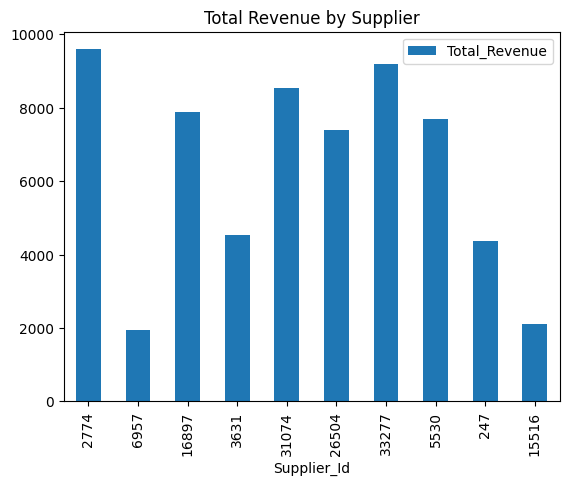

In [0]:
%python
%pip install plotly
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called comprehensive_suppliers
# You can replace it with your actual DataFrame name
df = comprehensive_suppliers.toPandas()

# Plot a bar chart
df.plot(kind='bar', x='Supplier_Id', y='Total_Revenue', title='Total Revenue by Supplier')
plt.show()


In [0]:
%python
import plotly.express as px
import pandas as pd

# Assuming comprehensive_suppliers is your DataFrame
# Convert to Pandas DataFrame
pandas_df = comprehensive_suppliers.toPandas()

# Sort the DataFrame by Recommendation_Score in descending order
sorted_df = pandas_df.sort_values(by='Recommendation_Score', ascending=False)

# Specify the number of top suppliers you want to display
top_n_suppliers = 5  # Replace with the desired number

# Select the top N suppliers
top_n_df = sorted_df.head(top_n_suppliers)

# Convert Supplier_Id to a string to avoid scientific notation
top_n_df['Supplier_Id'] = top_n_df['Supplier_Id'].astype(str)

# Create an interactive bar chart for the top N suppliers
fig = px.bar(
    top_n_df,
    x='Supplier_Id',
    y='Recommendation_Score',
    title=f'Top {top_n_suppliers} Suppliers Based on Recommendation Score',
    labels={'Recommendation_Score': 'Recommendation Score'},
    color='Business_Type',
    category_orders={'Supplier_Id': top_n_df['Supplier_Id'].tolist()}  # Set category order
)

fig.show()


/root/.ipykernel/927/command-475905845953123-2283759103:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_n_df['Supplier_Id'] = top_n_df['Supplier_Id'].astype(str)


# Thank You - Please do subscribe Analytix Cloud for more such projects :)